# Libraries

In [1]:
import torch
import os
from rfdetr import RFDETRSmall 
from pathlib import Path
import supervision as sv
from PIL import Image
import json
import matplotlib.pyplot as plt
import numpy as np

# Config Paths

In [2]:
try:
    PROJECT_ROOT = Path(os.getcwd()).parent
    BASE_DIR = PROJECT_ROOT / "data" / "Pieces Count.v1-dataset-basis-5-classes-24-11-2025.coco"
    TRAIN_JSON = BASE_DIR / "train" / "_annotations.coco.json"
    VAL_JSON   = BASE_DIR / "valid" / "_annotations.coco.json"
    TEST_JSON  = BASE_DIR / "test" / "_annotations.coco.json"
    TEST_DIR   = BASE_DIR / "test" 
    TRAIN_DIR  = BASE_DIR / "train" 
    VAL_DIR    = BASE_DIR / "valid"

    OUTPUT_DIR = (PROJECT_ROOT / "models" / "RF-DETR").resolve()
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    print("Rutas cargadas correctamente")
except Exception as e:
    print(f"Error al configurar las rutas: {e}")

Rutas cargadas correctamente


# Use GPU

In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Usando GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("No se detectó GPU, usando CPU.")


Usando GPU: NVIDIA GeForce RTX 2050


# Train model

In [ ]:
# define parameters and model
with open(TRAIN_JSON, 'r', encoding='utf-8') as f:
    categories = json.load(f)["categories"]
    NUM_CLASSES = len(categories)
    CLASS_NAMES = [cat["name"] for cat in categories]
print(f"Número de clases: {NUM_CLASSES}")
print(f"Nombres de las clases: {CLASS_NAMES}")
EPOCHS = 40
BATCH_SIZE = 2

model = RFDETRSmall(
    num_classes=NUM_CLASSES,
    pretrained=True
)

# Train the model
model.train(
    dataset_dir=str(BASE_DIR),
    train_annotation_path=str(TRAIN_JSON),
    val_annotation_path=str(VAL_JSON),
    output_dir=str(OUTPUT_DIR),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    device=device
)

Número de clases: 5
Nombres de las clases: ['Aleron', 'Aleron lateral', 'Alerones traseros', 'Tanque', 'Tapa NMAX']
Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights
Unable to initialize TensorBoard. Logging is turned off for this session.  Run 'pip install tensorboard' to enable logging.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=6, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=2, weight_decay=0.0001, epochs=40, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretra

Epoch: [0]  [  0/187]  eta: 0:55:48  lr: 0.000100  class_error: 100.00  loss: 8.3091 (8.3091)  loss_ce: 1.2316 (1.2316)  loss_bbox: 0.4235 (0.4235)  loss_giou: 0.2735 (0.2735)  loss_ce_0: 1.2017 (1.2017)  loss_bbox_0: 0.4961 (0.4961)  loss_giou_0: 0.3572 (0.3572)  loss_ce_1: 1.2120 (1.2120)  loss_bbox_1: 0.4817 (0.4817)  loss_giou_1: 0.3191 (0.3191)  loss_ce_enc: 1.0784 (1.0784)  loss_bbox_enc: 0.7650 (0.7650)  loss_giou_enc: 0.4695 (0.4695)  loss_ce_unscaled: 1.2316 (1.2316)  class_error_unscaled: 100.0000 (100.0000)  loss_bbox_unscaled: 0.0847 (0.0847)  loss_giou_unscaled: 0.1367 (0.1367)  cardinality_error_unscaled: 3662.5000 (3662.5000)  loss_ce_0_unscaled: 1.2017 (1.2017)  loss_bbox_0_unscaled: 0.0992 (0.0992)  loss_giou_0_unscaled: 0.1786 (0.1786)  cardinality_error_0_unscaled: 3474.0000 (3474.0000)  loss_ce_1_unscaled: 1.2120 (1.2120)  loss_bbox_1_unscaled: 0.0963 (0.0963)  loss_giou_1_unscaled: 0.1595 (0.1595)  cardinality_error_1_unscaled: 3636.0000 (3636.0000)  loss_ce_enc_un

# Results of training

Resultados del último test:
mAP@0.50:0.95: 0.9075725102612606
mAP@0.50: 0.9541328810131996
Precisión: 0.9726495726495726
Recall: 0.86
Por clase:
  A: mAP@0.50:0.95=0.831, mAP@0.50=0.862
  B: mAP@0.50:0.95=0.994, mAP@0.50=1.000
  C: mAP@0.50:0.95=0.898, mAP@0.50=1.000


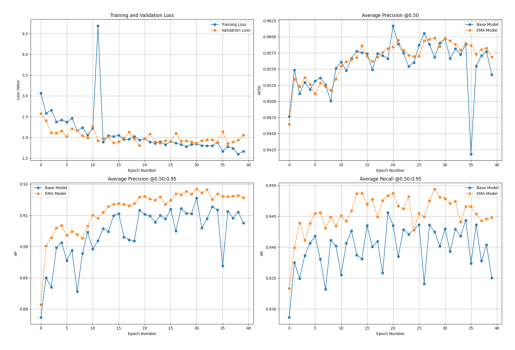

In [4]:
log_path = r"C:\Users\User\Documents\UdeA\GEPAR\SIMAYA\Simaya_software\models\RF-DETR\log.txt" 

with open(log_path, "r", encoding="utf-8") as f:
    lines = f.readlines()
    last = None
    # Busca la última línea con resultados
    for line in reversed(lines):
        if '"test_results_json"' in line:
            last = json.loads(line)
            break

if last:
    print("Resultados del último test:")
    print("mAP@0.50:0.95:", last["test_results_json"]["class_map"][-1]["map@50:95"])
    print("mAP@0.50:", last["test_results_json"]["class_map"][-1]["map@50"])
    print("Precisión:", last["test_results_json"]["class_map"][-1]["precision"])
    print("Recall:", last["test_results_json"]["class_map"][-1]["recall"])
    print("Por clase:")
    for clase in last["test_results_json"]["class_map"][:-1]:
        print(f"  {clase['class']}: mAP@0.50:0.95={clase['map@50:95']:.3f}, mAP@0.50={clase['map@50']:.3f}")

img_path = r"C:\Users\User\Documents\UdeA\GEPAR\SIMAYA\Simaya_software\models\RF-DETR\metrics_plot.png"  # Cambia por la ruta real
img = Image.open(img_path)
plt.imshow(img)
plt.axis("off")
plt.show()

# Test model (inference test)

In [40]:
NUM_CLASSES = len(json.load(open(TRAIN_JSON))["categories"])
CHECKPOINT_PATH = r"C:\\Users\\User\\Documents\\UdeA\\GEPAR\\SIMAYA\\Simaya_software\\models\\RF-DETR\\checkpoint_best_ema.pth"
IMAGE_PATH = r"C:\Users\User\Documents\UdeA\GEPAR\SIMAYA\Simaya_software\data\dataset_pieces_segmented\test\images\video_20250806_14_37_27_f23400_d0_c0_jpg.rf.09cf3521df11542106680b242f892978.jpg"

model = RFDETRSmall(num_classes=NUM_CLASSES)

state = torch.load(CHECKPOINT_PATH, map_location="cpu")

if "model" in state:
    state = state["model"]
elif "ema" in state:
    state = state["ema"]
elif "state_dict" in state:
    state = state["state_dict"]

try:
    torch_model = model.model.model
except AttributeError:
    torch_model = model.model

missing, unexpected = torch_model.load_state_dict(state, strict=False)
print("Pesos cargados correctamente.")
print("Missing keys:", missing)
print("Unexpected keys:", unexpected)

model.optimize_for_inference()

model.names = ["A", "B", "C"]

image = Image.open(IMAGE_PATH).convert("RGB")

detections = model.predict(image, conf_threshold=0.5)

adjusted_detection_class_ids = [int(cid) - 1 for cid in detections.class_id]

valid_mask = [i for i, cid in enumerate(adjusted_detection_class_ids) if 0 <= cid < NUM_CLASSES]

filtered = sv.Detections(
    xyxy=detections.xyxy[valid_mask],
    confidence=detections.confidence[valid_mask],
    class_id=np.array([adjusted_detection_class_ids[i] for i in valid_mask], dtype=int),
)

for i, (box, conf, cls_id_adjusted) in enumerate(zip(filtered.xyxy, filtered.confidence, filtered.class_id)):
    label = model.names[int(cls_id_adjusted)]
    print(f"Detección {i+1}: {label} ({conf:.2f}) -> BBox: {box.tolist()}")


Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights
Loading pretrain weights


Pesos cargados correctamente.
Missing keys: []
Unexpected keys: []


Detección 1: A (0.99) -> BBox: [148.87173461914062, 66.97917938232422, 562.2861938476562, 478.52508544921875]
Detección 2: B (0.98) -> BBox: [254.96356201171875, 341.68780517578125, 447.07684326171875, 455.713623046875]
Detección 3: C (0.95) -> BBox: [217.34548950195312, 480.0699157714844, 273.7781066894531, 515.4436645507812]


Clases del dataset (ds.classes): ['A', 'B', 'C']


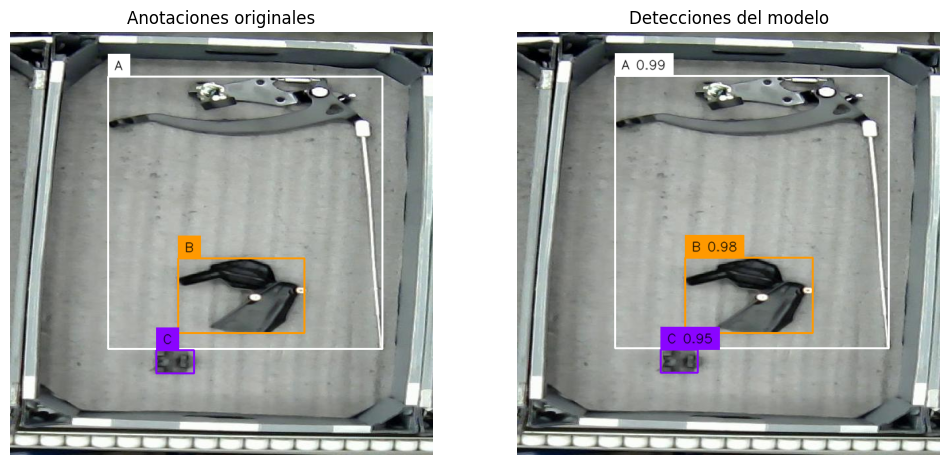

In [ ]:
ds = sv.DetectionDataset.from_coco(
    images_directory_path=TEST_DIR,
    annotations_path=TEST_JSON
)
print("Clases del dataset (ds.classes):", ds.classes)

annotations = None
image_name = os.path.basename(IMAGE_PATH)

for path, img, ann in ds:
    if image_name in path:
        annotations = ann
        break

if annotations is None:
    raise ValueError(f"No se encontraron anotaciones para la imagen: {image_name}")

detections = model.predict(image, conf_threshold=0.4)

text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)


color = sv.ColorPalette.from_hex([
    "#FFFFFF",
    "#FF9900", 
    "#8A04FF", 
])

bbox_annotator = sv.BoxAnnotator(color=color, thickness=thickness)
label_annotator = sv.LabelAnnotator(color=color, text_color=sv.Color.BLACK, text_scale=text_scale)

adjusted_detection_class_ids = [int(cid) - 1 for cid in detections.class_id]

valid_indices = [i for i, cid in enumerate(adjusted_detection_class_ids) if 0 <= cid < NUM_CLASSES]

if len(valid_indices) < len(detections.class_id):
    print(f"[Advertencia] Se descartaron {len(detections.class_id) - len(valid_indices)} detecciones con ID inválido después de ajustar.")

detections.xyxy = detections.xyxy[valid_indices]
detections.confidence = detections.confidence[valid_indices]
detections.class_id = np.array([adjusted_detection_class_ids[i] for i in valid_indices], dtype=int)

annotations_labels = [
    ds.classes[class_id]
    for class_id in annotations.class_id
    if (class_id) >= 0 and (class_id) < len(ds.classes)
]

detections_labels = [
    f"{ds.classes[int(class_id)]} {conf:.2f}"
    for class_id, conf in zip(detections.class_id, detections.confidence)
]

annotation_image = image.copy()
annotation_image = bbox_annotator.annotate(scene=annotation_image, detections=annotations)
annotation_image = label_annotator.annotate(scene=annotation_image, detections=annotations, labels=annotations_labels)

detections_image = image.copy()
detections_image = bbox_annotator.annotate(scene=detections_image, detections=detections)
detections_image = label_annotator.annotate(scene=detections_image, detections=detections, labels=detections_labels)

sv.plot_images_grid(
    images=[annotation_image, detections_image],
    grid_size=(1, 2),
    titles=["Anotaciones originales", "Detecciones del modelo"]
)
plt.show()


# Pipeline to test all images

Classes obtained from JSON (1-based IDs in JSON): ['A', 'B', 'C']
Number of classes: 3
Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights
Loading pretrain weights


Weights loaded successfully.
Missing keys: []
Unexpected keys: []
Dataset classes (ds.classes): ['A', 'B', 'C']

Starting model detection visualization for 69 test images...

Processing image: None
Dataset classes (ds.classes): ['A', 'B', 'C']

Starting model detection visualization for 69 test images...

Processing image: None


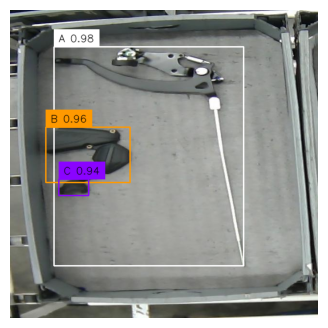


Processing image: None


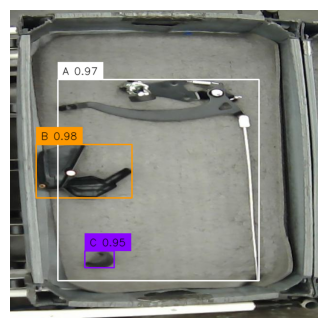


Processing image: None


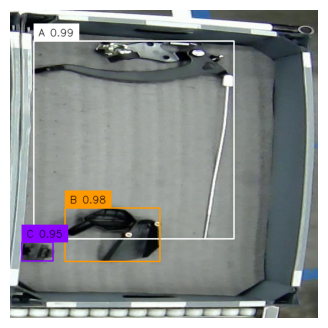


Processing image: None


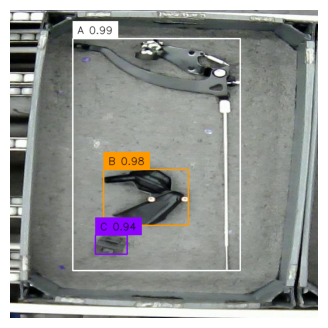


Processing image: None


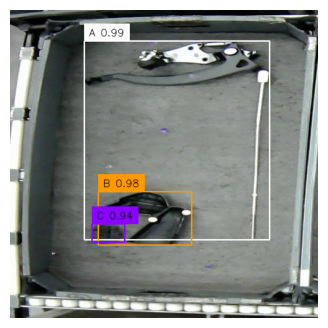


Processing image: None


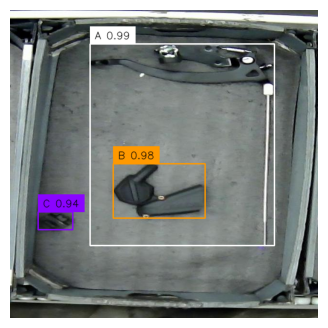


Processing image: None


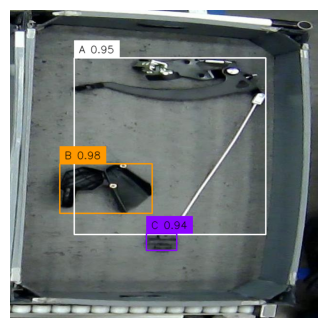


Processing image: None


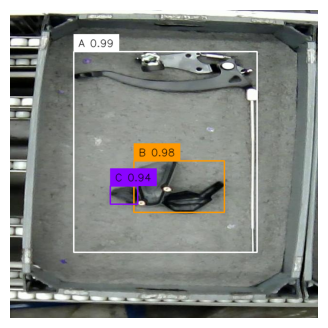


Processing image: None


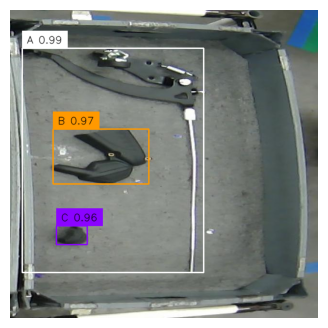


Processing image: None


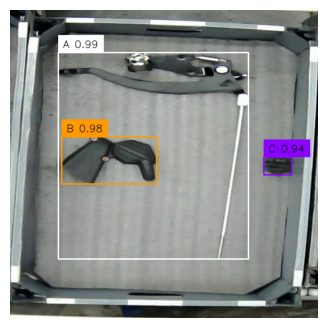


Processing image: None


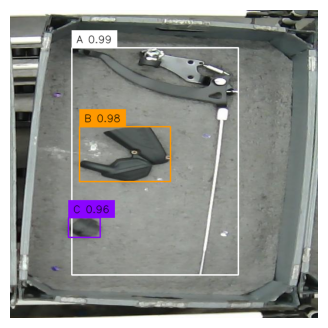


Processing image: None


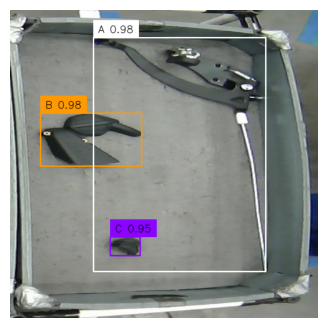


Processing image: None


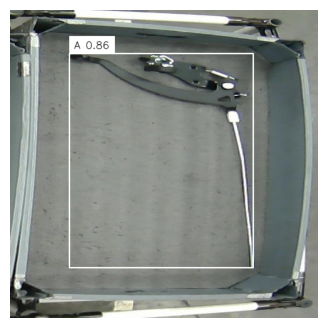


Processing image: None


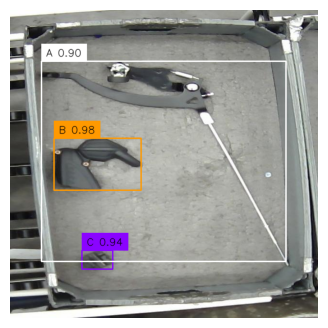


Processing image: None


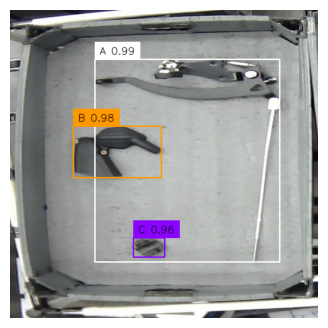


Processing image: None


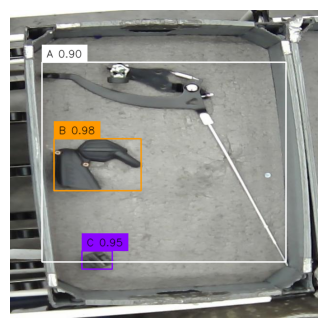


Processing image: None


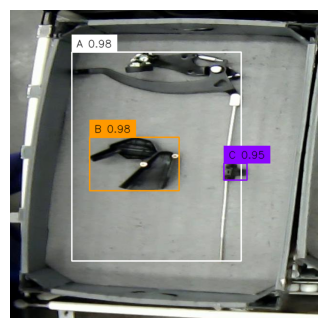


Processing image: None


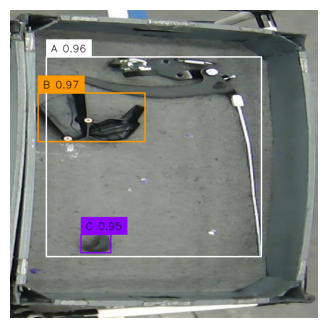


Processing image: None


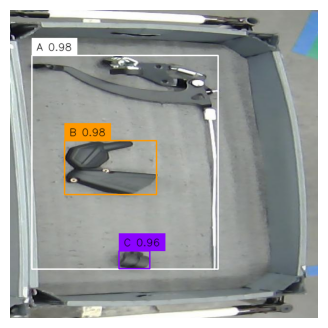


Processing image: None


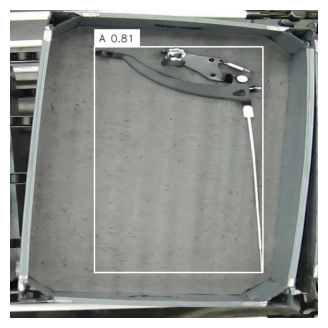


Processing image: None


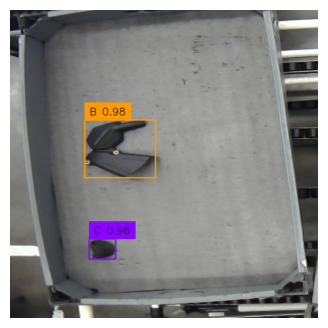


Processing image: None


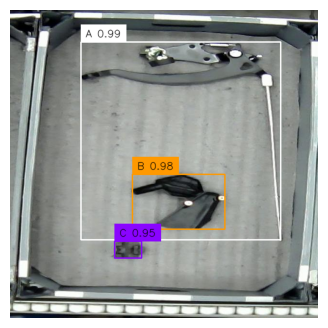


Processing image: None


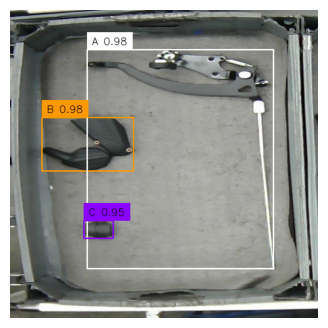


Processing image: None


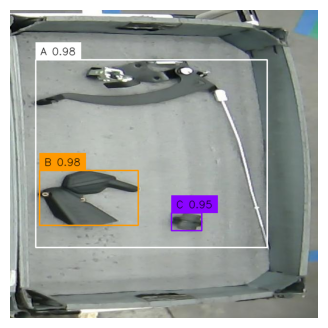


Processing image: None


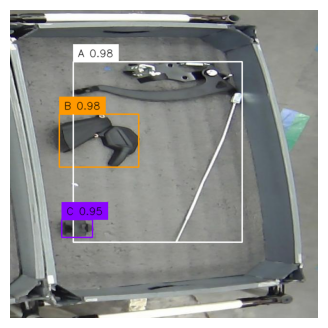


Processing image: None


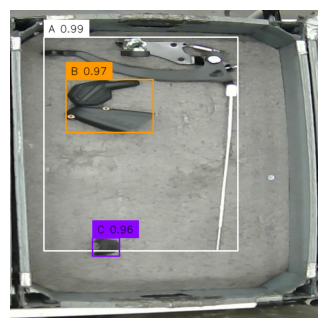


Processing image: None


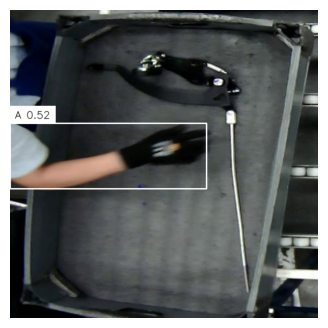


Processing image: None


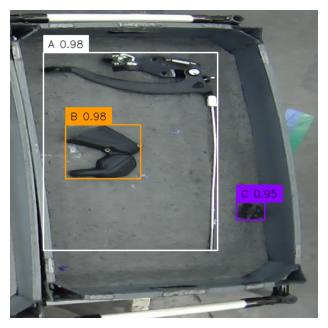


Processing image: None


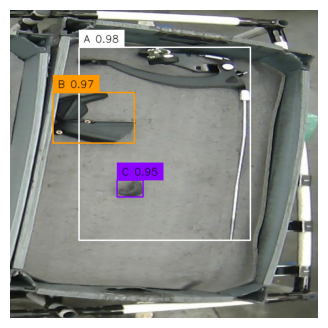


Processing image: None


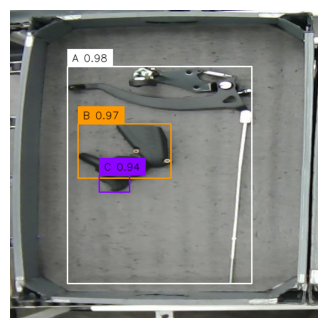


Processing image: None


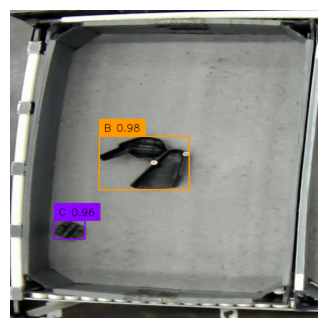


Processing image: None


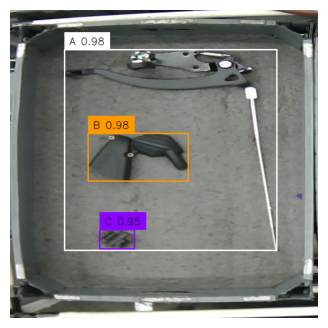


Processing image: None


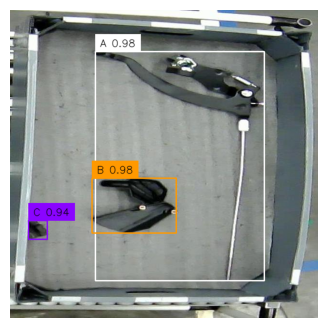


Processing image: None


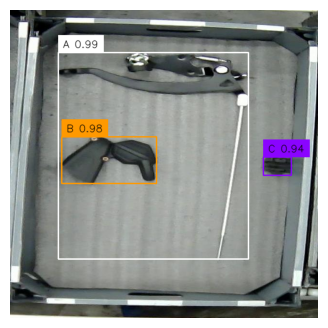


Processing image: None


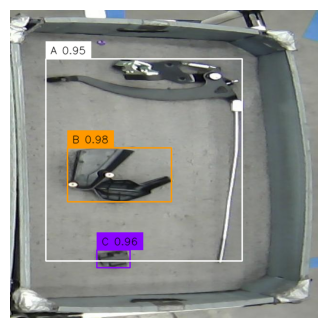


Processing image: None


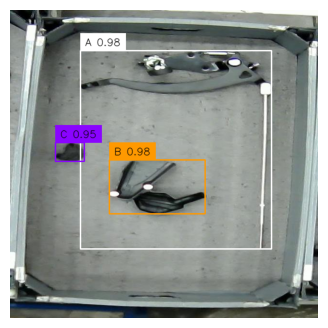


Processing image: None


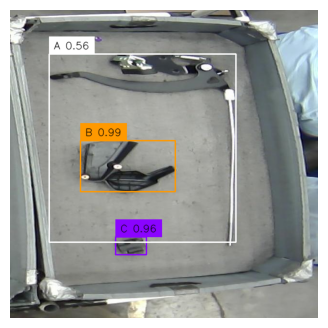


Processing image: None


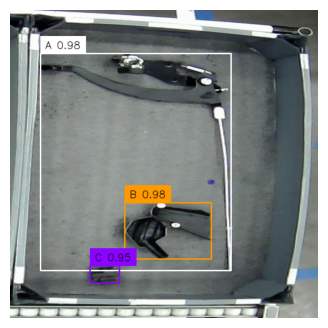


Processing image: None


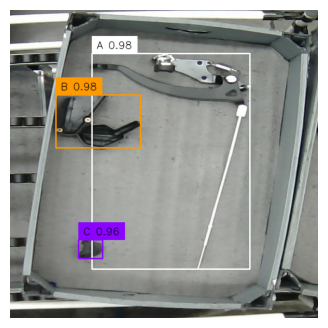


Processing image: None


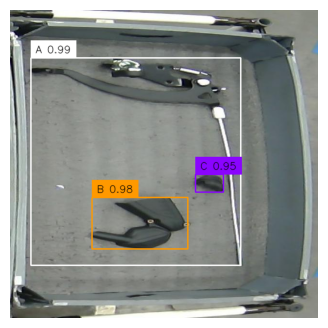


Processing image: None


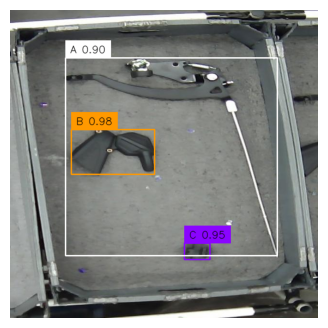


Processing image: None


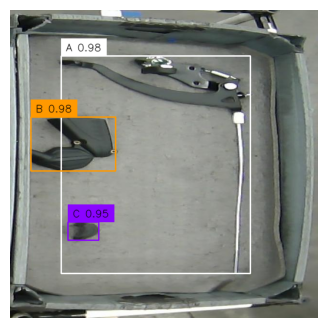


Processing image: None


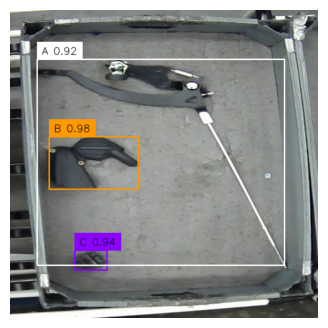


Processing image: None


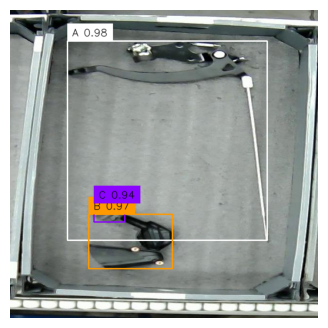


Processing image: None


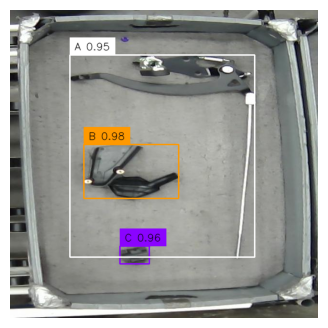


Processing image: None


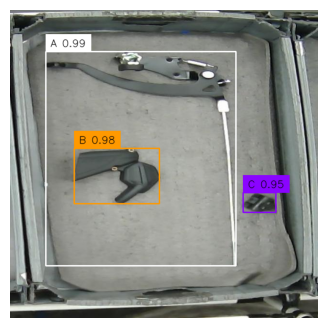


Processing image: None


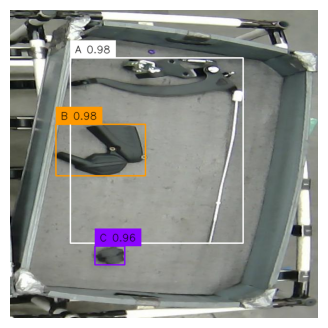


Processing image: None


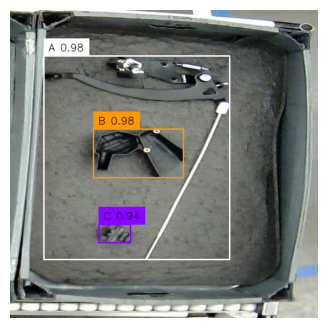


Processing image: None


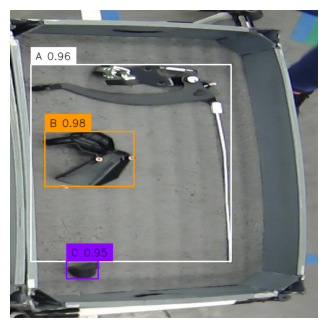


Processing image: None


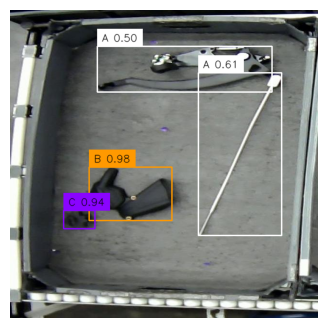


Processing image: None


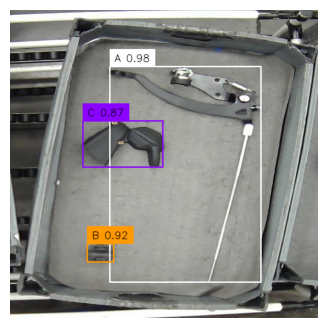


Processing image: None


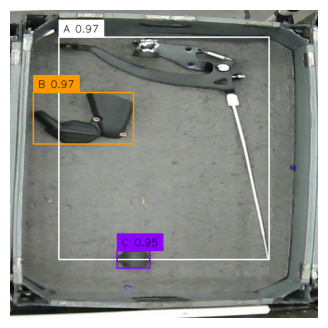


Processing image: None


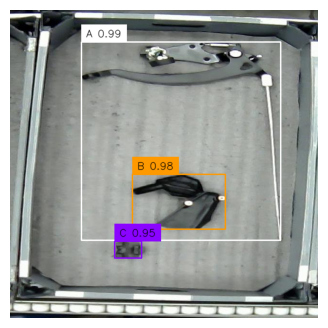


Processing image: None


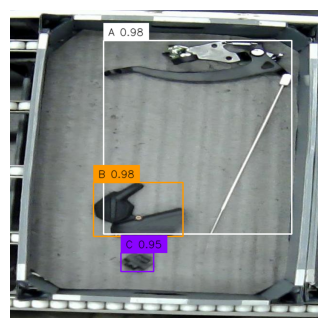


Processing image: None


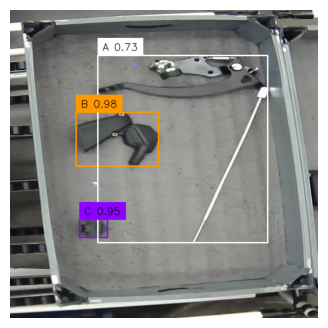


Processing image: None


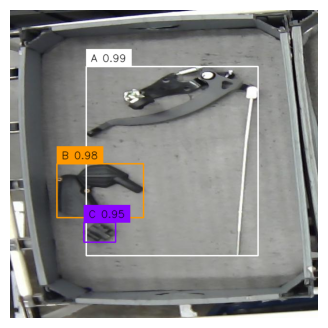


Processing image: None


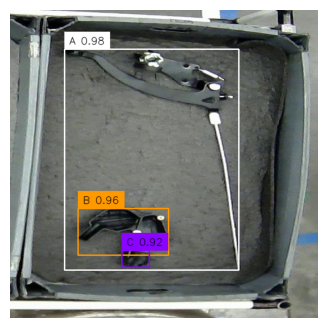


Processing image: None


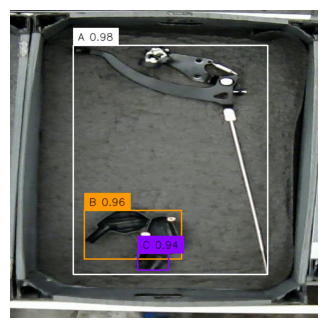


Processing image: None


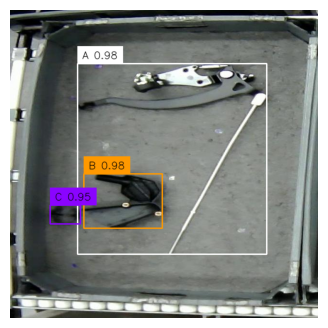


Processing image: None


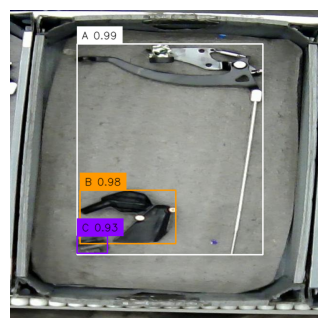


Processing image: None


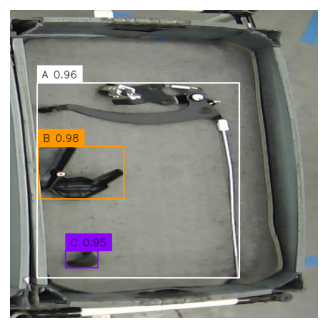


Processing image: None


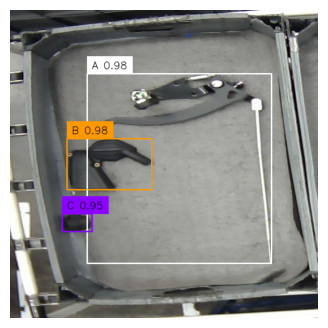


Processing image: None


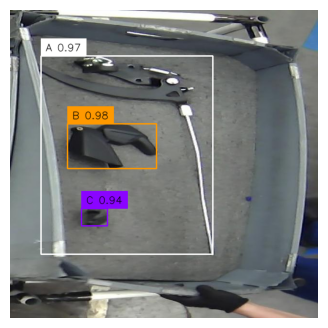


Processing image: None


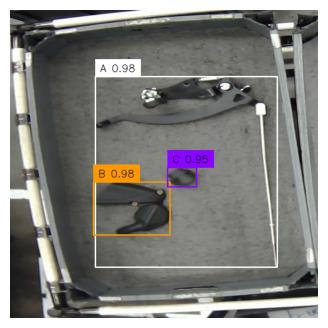


Processing image: None


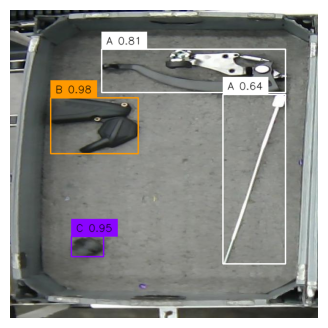


Processing image: None


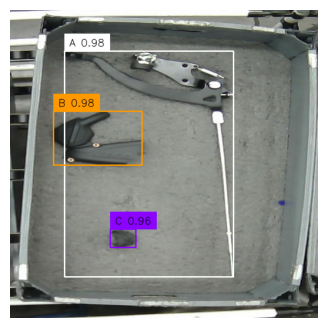


Processing image: None


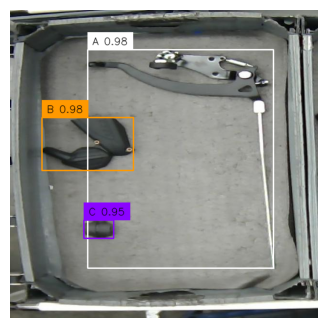


Processing image: None


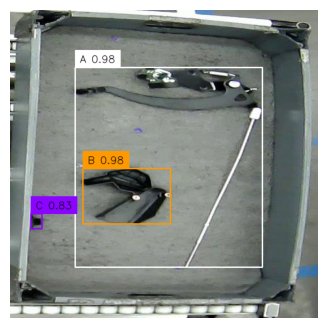


Processing image: None


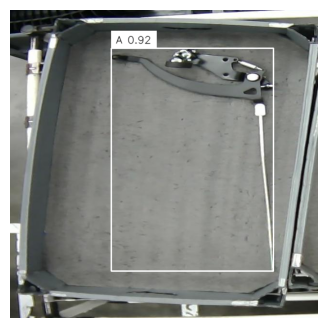


Model detection visualization process for all test images completed.


In [53]:
with open(TRAIN_JSON, 'r', encoding='utf-8') as f:
    coco_data = json.load(f)

sorted_categories = sorted(coco_data["categories"], key=lambda x: x['id'])
CLASS_NAMES_FROM_JSON = [cat['name'] for cat in sorted_categories]
NUM_CLASSES = len(CLASS_NAMES_FROM_JSON)

print(f"Classes obtained from JSON (1-based IDs in JSON): {CLASS_NAMES_FROM_JSON}")
print(f"Number of classes: {NUM_CLASSES}")

from rfdetr import RFDETRSmall

model = RFDETRSmall(num_classes=NUM_CLASSES)

CHECKPOINT_PATH = r"C:\\Users\\User\\Documents\\UdeA\\GEPAR\\SIMAYA\\Simaya_software\\models\\RF-DETR\\checkpoint_best_ema.pth"

state = torch.load(CHECKPOINT_PATH, map_location="cpu")

if "model" in state:
    state = state["model"]
elif "ema" in state:
    state = state["ema"]
elif "state_dict" in state:
    state = state["state_dict"]

try:
    torch_model = model.model.model
except AttributeError:
    torch_model = model.model

missing, unexpected = torch_model.load_state_dict(state, strict=False)
print("Weights loaded successfully.")
print("Missing keys:", missing)
print("Unexpected keys:", unexpected)

model.optimize_for_inference()

model.names = CLASS_NAMES_FROM_JSON

TEST_CONF_THRESHOLD = 0.4

color = sv.ColorPalette.from_hex([
    "#FFFFFF",
    "#FF9900",
    "#8A04FF",
])

bbox_annotator = sv.BoxAnnotator(color=color, thickness=2)
label_annotator = sv.LabelAnnotator(color=color, text_color=sv.Color.BLACK, text_scale=0.7)

ds = sv.DetectionDataset.from_coco(
    images_directory_path=TEST_DIR,
    annotations_path=TEST_JSON
)
print("Dataset classes (ds.classes):", ds.classes)

print(f"\nStarting model detection visualization for {len(ds)} test images...")

for image_path, image_name_from_ds, _ in ds:
    print(f"\nProcessing image: {image_name_from_ds}")
    
    current_image_file_name = Path(image_path).name
    correct_image_path = TEST_DIR / current_image_file_name

    try:
        image_pil = Image.open(correct_image_path).convert("RGB")
    except FileNotFoundError:
        print(f"ERROR: Could not open image at corrected path: {correct_image_path}")
        print(f"Please check if 'file_name' in your {TEST_JSON} contains subdirectories like 'images/' or 'test/images/' and correct it.")
        continue

    detections_model_raw = model.predict(image_pil, conf_threshold=TEST_CONF_THRESHOLD)

    adjusted_detection_class_ids = [int(cid) - 1 for cid in detections_model_raw.class_id]

    valid_indices = [i for i, cid in enumerate(adjusted_detection_class_ids) if 0 <= cid < NUM_CLASSES]

    if len(valid_indices) < len(detections_model_raw.class_id):
        print(f"  [Warning in {image_name_from_ds}] {len(detections_model_raw.class_id) - len(valid_indices)} detections with invalid ID discarded after adjustment.")

    detections_adjusted = sv.Detections(
        xyxy=detections_model_raw.xyxy[valid_indices],
        confidence=detections_model_raw.confidence[valid_indices],
        class_id=np.array([adjusted_detection_class_ids[i] for i in valid_indices], dtype=int),
    )

    detections_labels = [
        f"{ds.classes[int(class_id)]} {conf:.2f}"
        for class_id, conf in zip(detections_adjusted.class_id, detections_adjusted.confidence)
    ]

    detections_image = image_pil.copy()
    detections_image = bbox_annotator.annotate(scene=detections_image, detections=detections_adjusted)
    detections_image = label_annotator.annotate(scene=detections_image, detections=detections_adjusted, labels=detections_labels)

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.imshow(detections_image)
    ax.axis('off')
    plt.show()

print("\nModel detection visualization process for all test images completed.")